# Neural EMS

In [1]:
import numpy as np
import scipy.io as scio
import joblib
import time

from sklearn.neural_network import MLPRegressor,MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.metrics import f1_score,accuracy_score,precision_score,recall_score,roc_auc_score

import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

## Plot settings

In [2]:
from My_plot import *
plot_base()

default_color = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',\
              '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

## Train models

In [3]:
is_train = 0

data_path = r'FCV_EMS_DP_advisor_results\\'

In [4]:
if is_train:
    Input_cls = ('s','m') # single or multiple step input
    mat_name = ('train_data_matrix_00','train_data_matrix_11')
    column_name = (("veh_spd","veh_acc","bat_soc","soc_tgt","veh_dis","fcs_pwr","pwr_dmd",),\
       ("veh_spd","veh_acc","bat_soc","soc_tgt","veh_dis","fcs_pwr","pwr_dmd-","pwr_dmd","pwr_dmd+"))
    target_name = 'fcs_pwr'

    Model_cls = ('rgr','cls')

    for i in range(len(Input_cls)):
        train_data_matrix = scio.loadmat(data_path+mat_name[i]+'.mat')
        train_data = train_data_matrix[list(train_data_matrix.keys())[3]].T

        df = pd.DataFrame(train_data, columns=column_name[i])
        df[target_name] = round(df[target_name])

        train_data_x = np.array(df.drop([target_name], axis=1))
        train_data_y = np.array(df[target_name])

        train_set_x, test_set_x, train_set_y, test_set_y = train_test_split(train_data_x, train_data_y, random_state=0)

        print(train_set_x.shape)
        print(test_set_x.shape)

        train_data = (train_data_x,train_data_y)
        joblib.dump(train_data, r'Data\train_data_'+Input_cls[i]+'.pkl')

        for j in range(len(Model_cls)):
            if Model_cls[j] == 'rgr': 
                model = MLPRegressor(hidden_layer_sizes=(128,64,32,), random_state=0)
            else:
                model = MLPClassifier(hidden_layer_sizes=(128,64,32,), random_state=0)

            model.fit(train_set_x, train_set_y)
            # save models
            joblib.dump(model, r'NeuralEMS_Model\model_mlp_'+Model_cls[j]+'_'+Input_cls[i]+'.pkl')
            

## Load trained models

In [5]:
model_mlp_rgr_s = joblib.load(r"NeuralEMS_Model\model_mlp_rgr_s.pkl")
model_mlp_rgr_m = joblib.load(r"NeuralEMS_Model\model_mlp_rgr_m.pkl")
model_mlp_cls_s = joblib.load(r"NeuralEMS_Model\model_mlp_cls_s.pkl")
model_mlp_cls_m = joblib.load(r"NeuralEMS_Model\model_mlp_cls_m.pkl")

model_list = (model_mlp_rgr_s,model_mlp_rgr_m,model_mlp_cls_s,model_mlp_cls_m)
num_step_backward_list = (0,1,0,1,)
num_step_forward_list = num_step_backward_list

## Training performance

### R2 score

In [6]:
train_data_s = joblib.load(r'Data\train_data_s.pkl')
train_data_m = joblib.load(r'Data\train_data_m.pkl')

train_set_x_s, test_set_x_s, train_set_y_s, test_set_y_s = train_test_split(train_data_s[0], train_data_s[1], random_state=0)
train_set_x_m, test_set_x_m, train_set_y_m, test_set_y_m = train_test_split(train_data_m[0], train_data_m[1], random_state=0)

xy = ( ((train_set_x_s,train_set_y_s),(train_set_x_m,train_set_y_m),(train_set_x_s,train_set_y_s),(train_set_x_m,train_set_y_m)),\
       ((test_set_x_s,test_set_y_s),(test_set_x_m,test_set_y_m),(test_set_x_s,test_set_y_s),(test_set_x_m,test_set_y_m)) )
r2 = np.zeros([2,4])
f1 = np.zeros([2,4])

if is_train:
    for i in range(2):
        for j in range(4):
            r2[i,j] = r2_score(xy[i][j][1],model_list[j].predict(xy[i][j][0]))
            f1[i,j] = f1_score(xy[i][j][1],np.round(model_list[j].predict(xy[i][j][0])),average='weighted')

    pd.DataFrame(np.vstack([r2,f1]))

### Plot distribution

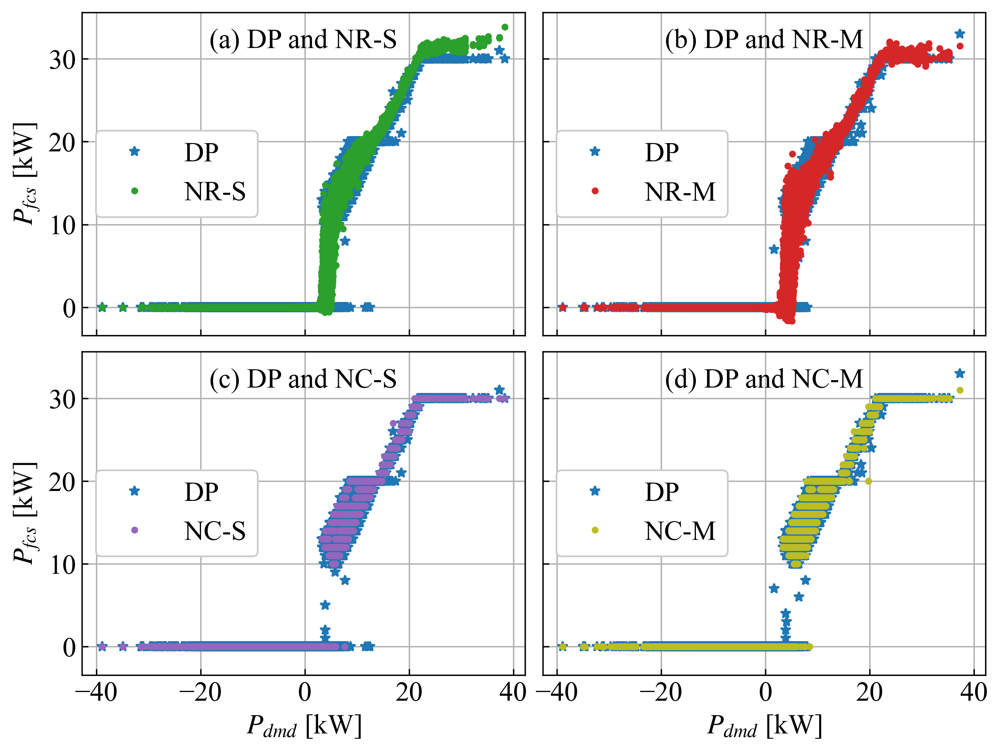

In [7]:
fig, [[ax1,ax2],[ax3,ax4],] = plt.subplots(2, 2, sharex=True, sharey=True, facecolor='white', figsize=(8,6), dpi=300)
fig.subplots_adjust(left=0.08, right=0.99, top=0.99, bottom=0.1,hspace=0.05,wspace=0.04)

x_s = test_set_x_s[:,-1]
x_m = test_set_x_m[:,-2]
y_p_rgr_s = model_mlp_rgr_s.predict(test_set_x_s)
y_p_rgr_m = model_mlp_rgr_m.predict(test_set_x_m)
y_p_cls_s = model_mlp_cls_s.predict(test_set_x_s)
y_p_cls_m = model_mlp_cls_m.predict(test_set_x_m)

title_name = ['(a) DP and NR-S','(b) DP and NR-M','(c) DP and NC-S','(d) DP and NC-M']
loc_inf = {'horizontalalignment':'center','verticalalignment':'center_baseline',}

ax1.plot(x_s,test_set_y_s, '*', label='DP')
ax1.plot(x_s,y_p_rgr_s, '.', label='NR-S',color=default_color[2])

ax1.set_ylabel('$P_{fcs}$ [kW]')
ax1.text(0.5,0.92, title_name[0],loc_inf,transform=ax1.transAxes)
ax1.grid()
# ax1.set_xlim(-50,50)
# ax1.set_ylim(-5,50)

ax2.plot(x_m,test_set_y_m, '*', label='DP')
ax2.plot(x_m,y_p_rgr_m, '.', label='NR-M',color=default_color[3])

ax2.text(0.5,0.92, title_name[1],loc_inf,transform=ax2.transAxes)
ax2.grid()

ax3.plot(x_s,test_set_y_s, '*', label='DP')
ax3.plot(x_s,y_p_cls_s, '.', label='NC-S',color=default_color[4])

ax3.set_xlabel('$P_{dmd}$ [kW]')
ax3.set_ylabel('$P_{fcs}$ [kW]')
ax3.text(0.5,0.92, title_name[2],loc_inf,transform=ax3.transAxes)
ax3.grid()

ax4.plot(x_m,test_set_y_m, '*', label='DP')
ax4.plot(x_m,y_p_cls_m, '.', label='NC-M',color=default_color[8])

ax4.set_xlabel('$P_{dmd}$ [kW]')
ax4.text(0.5,0.92, title_name[3],loc_inf,transform=ax4.transAxes)
ax4.grid()

[ax.legend(loc = 6, framealpha=1) for ax in [ax1,ax2,ax3,ax4]]

fig.savefig(r"Fig\DistributionTestset.png")


### Plot distribution - R1

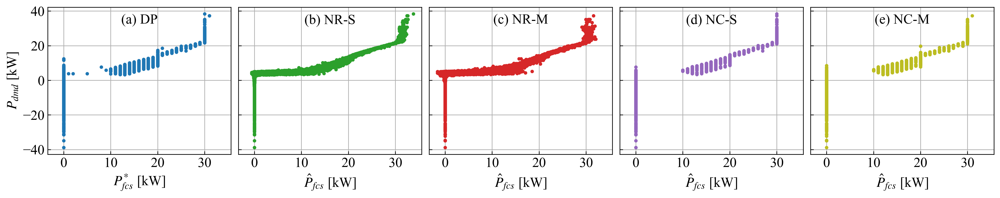

In [8]:
fig, [ax1,ax2,ax3,ax4,ax5,] = plt.subplots(1, 5, sharex=True, sharey=True, facecolor='white', figsize=(16,3), dpi=300)
fig.subplots_adjust(left=0.04, right=0.99, top=0.99, bottom=0.2,hspace=0.05,wspace=0.04)

x_s = test_set_x_s[:,-1]
x_m = test_set_x_m[:,-2]
y_p_rgr_s = model_mlp_rgr_s.predict(test_set_x_s)
y_p_rgr_m = model_mlp_rgr_m.predict(test_set_x_m)
y_p_cls_s = model_mlp_cls_s.predict(test_set_x_s)
y_p_cls_m = model_mlp_cls_m.predict(test_set_x_m)

title_name = ['(a) DP', '(b) NR-S','(c) NR-M','(d) NC-S','(e) NC-M']
loc_inf = {'horizontalalignment':'center','verticalalignment':'center_baseline',}

ax1.plot(test_set_y_s,x_s, '.', label='DP')
ax2.plot(y_p_rgr_s,x_s, '.', label='NR-S',color=default_color[2])
ax3.plot(y_p_rgr_m,x_m, '.', label='NR-M',color=default_color[3])
ax4.plot(y_p_cls_s,x_s, '.', label='NC-S',color=default_color[4])
ax5.plot(y_p_cls_m,x_m, '.', label='NC-M',color=default_color[8])

ax1.set_ylabel('$P_{dmd}$ [kW]')

axs = [ax1,ax2,ax3,ax4,ax5,]
for i,ax in enumerate(axs[1:]):
    ax.set_xlabel('${{\hat{P}}_{fcs}}$ [kW]')
ax1.set_xlabel('$P_{fcs}^{*}$ [kW]')

for i,ax in enumerate(axs):
    ax.text(0.5,0.92, title_name[i],loc_inf,transform=ax.transAxes)
    ax.grid()
    # ax.legend(loc = 6, framealpha=1)

fig.savefig(r"Fig\DistributionTestset.png")


## Prepare

### Load FCV model

In [9]:
from FCV_Modelling_Class import FCV_model
FCV = FCV_model()

# parent directory of cycles
cycle_path = r'StandardCycle_kph_column\\'

### Shooting function

In [10]:
def find_SoC_T_shooting(dsoc=2e-4,soc_T_1=0.5,soc_T_2=0.7,max_iter=20,if_print=False):
    # soc_ini,soc_tgt,
    # model,num_step_backward,num_step_forward,
    # spd_vector,acc_vector,dis_vector,dmd_vector,spd_length,
    
    jj = 1
    soc_T_list = []
    soc_f_list = []
    while jj < max_iter:
        soc = soc_ini
        soc_T = (soc_T_1+soc_T_2) / 2
        for i in range(spd_length):
            idx = np.clip( np.arange(i-num_step_backward,i+num_step_forward+1),0,spd_length-1 )
            spd = spd_vector[i]
            acc = acc_vector[i]
            dis = dis_vector[i]
            pwr_dmd = dmd_vector[idx]
            input_x = np.reshape(np.concatenate([np.array([spd,acc,soc,soc_T,dis]),pwr_dmd]),(1,-1))
            fcs_pwr = np.clip(model.predict(input_x)[0],0,50) # 2D input, 1D output
            out = FCV.run(spd,acc,soc,fcs_pwr * 1000, output_soc_f_only=True)
            
            soc = out['Bat_soc'][0] # update SOC
        
        if if_print:
            print(f'Iter is {jj:3d}, SOC is {soc}, k is {soc_T:.6f}, k1 is {soc_T_1:.6f}, k2 is {soc_T_2:.6f}.')
        
        soc_T_list.append(soc_T)
        soc_f_list.append(soc)
        
        if soc - soc_tgt > dsoc:
            soc_T_1, soc_T_2 = soc_T_1, soc_T
        elif soc - soc_tgt < -dsoc:
            soc_T_1, soc_T_2 = soc_T, soc_T_2
        else:
            break

        jj += 1

    return soc_T,np.array(soc_T_list),np.array(soc_f_list)

## Shooting Proof

### Final SOC - Target SOC

In [11]:
cycles = ('HWFET','JP1015',)

soc_tgt_list = np.arange(0.3,0.9,0.05)
soc_fnl_list = [ [ [] for j in range(len(model_list)) ] for i in range(len(cycles)) ] # (2, 4, 0)

if is_train:
    for j in range(len(cycles)):
        for h in range(len(model_list)):
            num_step_backward = num_step_backward_list[h]
            num_step_forward = num_step_backward
            model = model_list[h]

            soc_list = []
            for k in range(len(soc_tgt_list)):
                # load data
                data = scio.loadmat(cycle_path + cycles[j] + ".mat")
                spd_vector = np.squeeze(data[list(data.keys())[3]]) / 3.6 #['__header__', '__version__', '__globals__', 'CLTC_P']
                acc_vector = np.append(np.diff(spd_vector,axis=0),0)
                dis_vector = np.cumsum(spd_vector) / np.sum(spd_vector)
                dmd_result = FCV.run_Pdmd(spd_vector,acc_vector)
                dmd_vector = dmd_result['P_dem_m'] / 1000
                spd_length = spd_vector.size

                time_end = time.time()

                soc_ini = 0.60
                soc_tgt = 0.60
                soc_tgt_new = soc_tgt_list[k]
                soc = soc_ini

                for i in range(spd_length):
                    idx = np.clip( np.arange(i-num_step_backward,i+num_step_forward+1),0,spd_length-1 )
                    spd = spd_vector[i]
                    acc = acc_vector[i]
                    dis = dis_vector[i]
                    pwr_dmd = dmd_vector[idx]
                    input_x = np.reshape(np.concatenate([np.array([spd,acc,soc,soc_tgt_new,dis]),pwr_dmd]),(1,-1))
                    fcs_pwr = np.clip(model.predict(input_x)[0],0,50)
                    out = FCV.run(spd,acc,soc,fcs_pwr * 1000)
                    soc = out['Bat_soc'][0]

                soc_list.append(soc)

            soc_fnl_list[j][h] = np.array(soc_list)

    joblib.dump(soc_fnl_list, r'Results\soc_fnl_list.pkl')
    
else:
    soc_fnl_list = joblib.load(r'Results\soc_fnl_list.pkl')
    

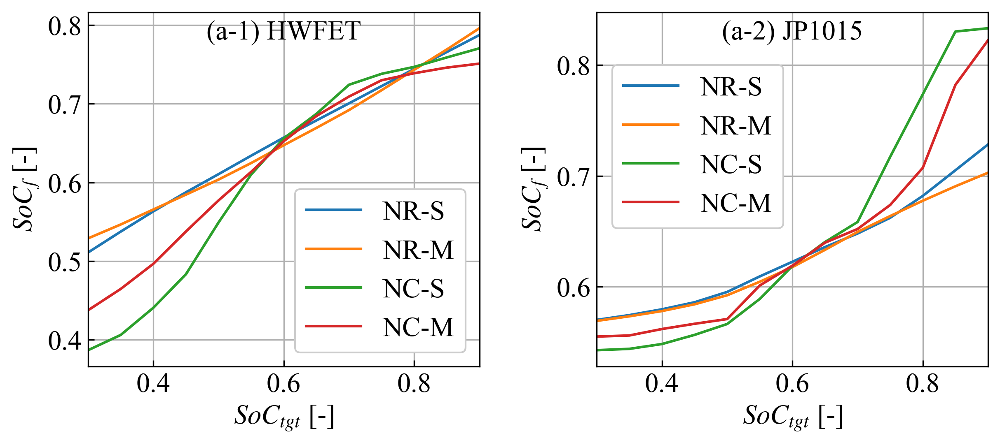

In [12]:
fig, [ax1,ax2,] = plt.subplots(1, 2, sharex=False, sharey=False, facecolor='white', figsize=(8,3.5), dpi=300,)
fig.subplots_adjust(left=0.08, right=0.99, top=0.99, bottom=0.17,hspace=0.05,wspace=0.3)

x_lim = (0.3,0.9)
loc_inf = {'horizontalalignment':'center','verticalalignment':'center_baseline',}
ncol_num = 1
label_name = ['NR-S','NR-M','NC-S','NC-M']
title_name = ['(a-1) HWFET','(a-2) JP1015']

[ax1.plot(soc_tgt_list, soc_fnl_list[0][i].T) for i in range(4)]
ax1.set_xlabel('${SoC}_{tgt}$ [-]')
ax1.set_ylabel('${SoC}_{f}$ [-]')
ax1.legend(loc = 4, framealpha=1, labels=label_name, ncol=ncol_num)
ax1.grid()
ax1.text(0.5,0.95, title_name[0],loc_inf,transform=ax1.transAxes)
ax1.set_xlim(x_lim)
# ax1.set_ylim(0.37,0.84)

[ax2.plot(soc_tgt_list, soc_fnl_list[1][i].T) for i in range(4)]
ax2.set_xlabel('${SoC}_{tgt}$ [-]')
ax2.set_ylabel('${SoC}_{f}$ [-]')
ax2.legend(loc = 6, bbox_to_anchor=(0.005,0.62), framealpha=1, labels=label_name, ncol=ncol_num)
ax2.grid()
ax2.text(0.5,0.95, title_name[1],loc_inf,transform=ax2.transAxes)
ax2.set_xlim(x_lim)
# ax2.set_ylim(0.535,0.77)

fig.savefig(r'Fig\FinalTargetSOC.png')


### Final SOC - iteration number

In [13]:
cycles = ('CLTC_P', 'FTP_72', 'JC08', 'NEDC',)

soc_fnl_list_2 = [ [ [] for j in range(len(model_list)) ] for i in range(len(cycles)) ] # (4, 4, 0)


if 0:
    for j in range(len(cycles)):
        for h in range(len(model_list)):
            model = model_list[h]
            num_step_backward = num_step_backward_list[h]
            num_step_forward = num_step_backward
            # load data
            data = scio.loadmat(cycle_path + cycles[j] + ".mat")
            spd_vector = np.squeeze(data[list(data.keys())[3]]) / 3.6 #['__header__', '__version__', '__globals__', 'CLTC_P']
            acc_vector = np.append(np.diff(spd_vector,axis=0),0)
            dis_vector = np.cumsum(spd_vector) / np.sum(spd_vector)
            dmd_result = FCV.run_Pdmd(spd_vector,acc_vector)
            dmd_vector = dmd_result['P_dem_m'] / 1000
            spd_length = spd_vector.size

            soc_ini = 0.60
            soc_tgt = 0.60
            _,_,soc_f_shooting = find_SoC_T_shooting(dsoc=2e-4,soc_T_1=0.3,soc_T_2=0.9)
            soc_fnl_list_2[j][h] = soc_f_shooting

    joblib.dump(soc_fnl_list_2, r'Results\soc_fnl_list_2.pkl')
    
else:
    soc_fnl_list_2 = joblib.load(r'Results\soc_fnl_list_2.pkl')
    

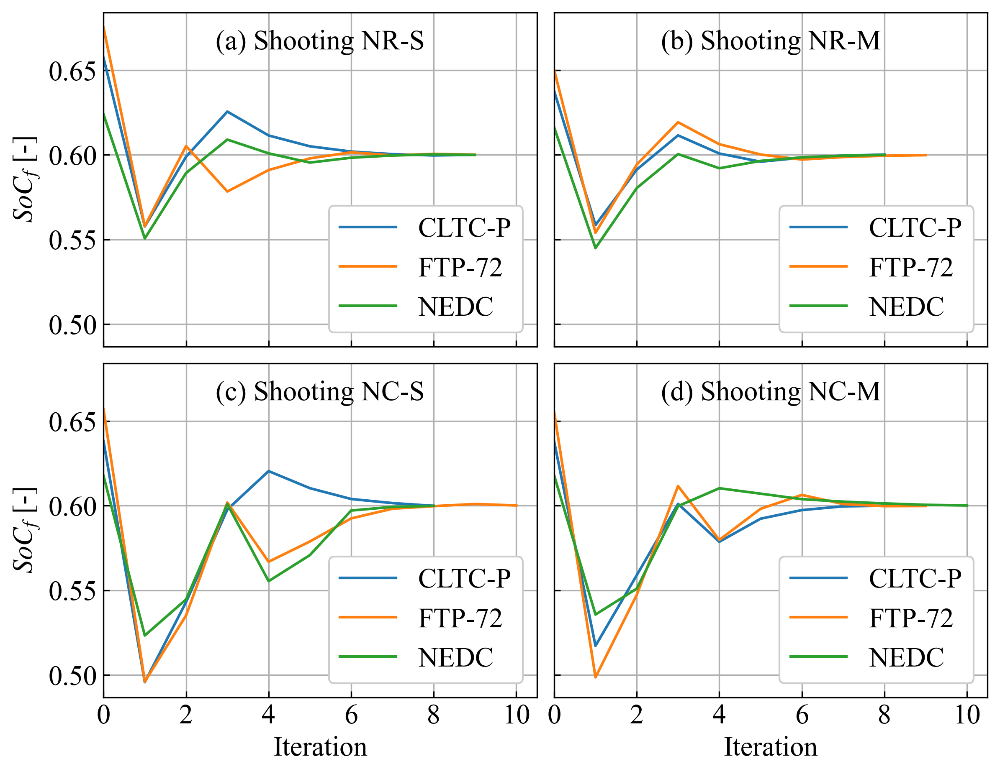

In [14]:
fig, [[ax1,ax2],[ax3,ax4,]] = plt.subplots(2, 2, sharex=True, sharey=True, facecolor='white', figsize=(8,6), dpi=300,)
fig.subplots_adjust(left=0.11, right=0.99, top=0.99, bottom=0.08,hspace=0.05,wspace=0.04)

x_lim = (0,10.5)
label_name = ['CLTC-P','FTP-72','NEDC']
title_name = ['(a) Shooting NR-S','(b) Shooting NR-M','(c) Shooting NC-S','(d) Shooting NC-M']
idx_list = [0,1,3]
loc_inf = {'horizontalalignment':'center','verticalalignment':'center_baseline',}
ncol_num = 1

[ax1.plot(soc_fnl_list_2[i][0].T) for i in idx_list]
ax1.set_ylabel('${SoC}_{f}$ [-]')
ax1.set_xlim(x_lim)
ax1.set_xticks(range(0,11,2))

[ax2.plot(soc_fnl_list_2[i][1].T) for i in idx_list]

[ax3.plot(soc_fnl_list_2[i][2].T) for i in idx_list]
ax3.set_xlabel('Iteration')
ax3.set_ylabel('${SoC}_{f}$ [-]')

[ax4.plot(soc_fnl_list_2[i][3].T) for i in idx_list]
ax4.set_xlabel('Iteration')

for idx,ax in enumerate([ax1,ax2,ax3,ax4,]):
    ax.grid()
    ax.legend(loc = 4, framealpha=1, labels=label_name, ncol=ncol_num)
    ax.text(0.5,0.92, title_name[idx],loc_inf,transform=ax.transAxes)

fig.savefig(r'Fig\Iterations.png')


## Shooting NeuralEMS

### Get results - ECMS

In [15]:
from ECMS_Class import ECMS
modes = ['CS@60','CS@90','CD@70-50',]

if 0:
    for mode in modes:
        if mode == modes[2]:
            cycles = ('C_CFN', 'RealDC', )
            cycle_path = r'StandardCycle_kph_column\NewAdded\\'
            soc_i = 0.7
            soc_o = 0.5
        else:
            cycles = ('CLTC_P', 'FTP_72', 'JC08', 'NEDC',)
            cycle_path = r'StandardCycle_kph_column\\'
            if mode == modes[0]:
                soc_i = 0.6
                soc_o = 0.6
            else:
                soc_i = 0.9
                soc_o = 0.9

        Results_all = np.zeros([len(cycles),3])
        res_all = []

        writer = pd.ExcelWriter(r'Results\Results_all'+'_'+mode+'_ECMS.xlsx')
        for k in range(len(cycles)):#[0,]:#
            data = scio.loadmat(cycle_path + cycles[k] + ".mat")
            veh_spd = np.squeeze(data[list(data.keys())[3]]) / 3.6 #['__header__', '__version__', '__globals__', 'CLTC_P']
            veh_acc = np.append(np.diff(veh_spd,axis=0),0)

            time_start = time.time()

            ECMS_1 = ECMS(veh_spd,veh_acc,soc_ini = soc_i,soc_tgt = soc_o,grid_u=50)
            res,k_opt = ECMS_1.ECMS_shooting(dsoc=2e-4,max_iter = 20,k_1=0.2,k_2=2,print_detail=True)

            time_end = time.time()
            time_cost = time_end - time_start

            Final_SOC = res['Bat_soc'][-1]
            H2_cost = np.sum(res['FC_fuel'])
            Results_all[k,:] = [time_cost, Final_SOC, H2_cost]
            print(f"Final soc is: {Final_SOC:.6f}; Fuel cost is: {H2_cost:.2f} g, Time cost is {time_cost:.2f} s, optimal k is {k_opt:.4f}.")

            res_all.append(res)


        joblib.dump(res_all, r'Results\res_all_ecms_'+mode+'.pkl')

        df = pd.DataFrame(Results_all)
        df.to_excel(writer,sheet_name='ECMS')
        writer.save()

        pd.DataFrame(data=Results_all)

### Get results - shooting OR not

In [16]:
names = ['rgr_s','rgr_m','cls_s','cls_m',]

modes = ['CS@60','CS@90','CD@70-50',]

if 0:
    for mode in modes:
        if mode == modes[2]:
            cycles = ('C_CFN', 'RealDC', )
            cycle_path = r'StandardCycle_kph_column\NewAdded\\'
            soc_i = 0.7
            soc_o = 0.5
        else:
            cycles = ('CLTC_P', 'FTP_72', 'JC08', 'NEDC',)
            cycle_path = r'StandardCycle_kph_column\\'
            if mode == modes[0]:
                soc_i = 0.6
                soc_o = 0.6
            else:
                soc_i = 0.9
                soc_o = 0.9

        shooting = 1
        if 1:
            writer = pd.ExcelWriter(r'Results\Results_all'+str(shooting)+'_'+mode+'.xlsx')
            for h in range(len(model_list)):
                Results_all = np.zeros([len(cycles),3])
                res_all = []

                num_step_backward = num_step_backward_list[h]
                num_step_forward = num_step_backward
                model = model_list[h]
                name = names[h]
                for k in range(len(cycles)):#[2,]:#
                    # load data
                    data = scio.loadmat(cycle_path + cycles[k] + ".mat")
                    spd_vector = np.squeeze(data[list(data.keys())[3]]) / 3.6 #['__header__', '__version__', '__globals__', 'CLTC_P']
                    acc_vector = np.append(np.diff(spd_vector,axis=0),0)
                    dis_vector = np.cumsum(spd_vector) / np.sum(spd_vector)
                    dmd_result = FCV.run_Pdmd(spd_vector,acc_vector)
                    dmd_vector = dmd_result['P_dem_m'] / 1000
                    spd_length = spd_vector.size

                    time_start = time.time()

                    soc_ini = soc_i
                    soc_tgt = soc_o
                    if shooting:
                        soc_tgt,_,_ = find_SoC_T_shooting(dsoc=2e-4,soc_T_1=0.3,soc_T_2=0.9,if_print=False)
                    soc = soc_ini
                    res = {}

                    for i in range(spd_length):
                        idx = np.clip( np.arange(i-num_step_backward,i+num_step_forward+1),0,spd_length-1 )
                        spd = spd_vector[i]
                        acc = acc_vector[i]
                        dis = dis_vector[i]
                        pwr_dmd = dmd_vector[idx]
                        input_x = np.reshape(np.concatenate([np.array([spd,acc,soc,soc_tgt,dis]),pwr_dmd]),(1,-1))
                        fcs_pwr = np.clip(model.predict(input_x)[0],0,50)
                        out = FCV.run(spd,acc,soc,fcs_pwr * 1000)

                        soc = out['Bat_soc']
                        if i==0:
                            res.update(out)
                        else:
                            for key,value in out.items():
                                res[key] = np.concatenate((res[key],value))

                    time_end = time.time()
                    time_cost = time_end - time_start

                    Final_SOC = res['Bat_soc'][-1]
                    H2_cost = np.sum(res['FC_fuel'])
                    Results_all[k,:] = [time_cost, Final_SOC, H2_cost]
                    print(f"Final soc is: {Final_SOC:.6f}; Fuel cost is: {H2_cost:.2f} g, Time cost is {time_cost:.2f} s, optimal SOC_tgt is {soc_tgt:.6f}.")

                    res_all.append(res)

                print('*'*30)

                if shooting:
                    joblib.dump(res_all, r'Results\res_all_'+name+'_'+mode+'.pkl')
                df = pd.DataFrame(Results_all)
                df.to_excel(writer,sheet_name=name)
                writer.save()


### Load results

In [17]:
res_all_rgr_s = joblib.load(r"Results\res_all_rgr_s_CS@60.pkl")
res_all_rgr_m = joblib.load(r"Results\res_all_rgr_m_CS@60.pkl")
res_all_cls_s = joblib.load(r"Results\res_all_cls_s_CS@60.pkl")
res_all_cls_m = joblib.load(r"Results\res_all_cls_m_CS@60.pkl")
res_all_ecms = joblib.load(r"Results\res_all_ecms_CS@60.pkl")
res_all_dp_all = scio.loadmat(data_path+'res_mxSoC_T_test_20220628_CS@60.mat')
res_all_dp = res_all_dp_all['res_mxSoC_T_test'][0][0][0][0]
res_all_dp_P_bat = []
[res_all_dp_P_bat.append(res_all_dp_all['res_mxSoC_T_test'][0][0]['dp_res_m'][0,i]['Bat_pwr'][0][0][0]/1000) for i in range(4)]
res_all_dp_m_fcs = []
[res_all_dp_m_fcs.append(res_all_dp_all['res_mxSoC_T_test'][0][0]['dp_res_m'][0,i]['FC_fuel'][0][0][0]) for i in range(4)]

[None, None, None, None]

In [18]:
res_all_rgr_s_CD = joblib.load(r"Results\res_all_rgr_s_CD@70-50.pkl")
res_all_rgr_m_CD = joblib.load(r"Results\res_all_rgr_m_CD@70-50.pkl")
res_all_cls_s_CD = joblib.load(r"Results\res_all_cls_s_CD@70-50.pkl")
res_all_cls_m_CD = joblib.load(r"Results\res_all_cls_m_CD@70-50.pkl")
res_all_ecms_CD = joblib.load(r"Results\res_all_ecms_CD@70-50.pkl")
res_all_dp_all_CD = scio.loadmat(data_path+'res_mxSoC_T_test_20220628_CD@70-50.mat')
res_all_dp_CD = res_all_dp_all_CD['res_mxSoC_T_test'][0][0][0][0]
res_all_dp_P_bat_CD = []
[res_all_dp_P_bat_CD.append(res_all_dp_all_CD['res_mxSoC_T_test'][0][0]['dp_res_m'][0,i]['Bat_pwr'][0][0][0]/1000) for i in range(2)]
res_all_dp_m_fcs_CD = []
[res_all_dp_m_fcs_CD.append(res_all_dp_all_CD['res_mxSoC_T_test'][0][0]['dp_res_m'][0,i]['FC_fuel'][0][0][0]) for i in range(2)]

[None, None]

### get u and x

In [19]:
traj_u_all = []
traj_s_all = []
traj_m_all = []
traj_s_all_CD = []
traj_m_all_CD = []

for i in range(4): # each cycle, dp+ecms+nn
    u_dp = res_all_dp[i][-1,:]
    u_ecms = res_all_ecms[i]['FCS_pwr'] / 1000
    u_rgr_s = res_all_rgr_s[i]['FCS_pwr'] / 1000
    u_rgr_m = res_all_rgr_m[i]['FCS_pwr'] / 1000
    u_cls_s = res_all_cls_s[i]['FCS_pwr'] / 1000
    u_cls_m = res_all_cls_m[i]['FCS_pwr'] / 1000
    traj_u_all.append(np.reshape(np.concatenate([u_dp,u_ecms,u_rgr_s,u_rgr_m,u_cls_s,u_cls_m]),(6,-1)))
    
    s_dp = res_all_dp[i][2,:]
    s_ecms = res_all_ecms[i]['Bat_soc']
    s_rgr_s = res_all_rgr_s[i]['Bat_soc']
    s_rgr_m = res_all_rgr_m[i]['Bat_soc']
    s_cls_s = res_all_cls_s[i]['Bat_soc']
    s_cls_m = res_all_cls_m[i]['Bat_soc']
    traj_s_all.append(np.reshape(np.concatenate([s_dp,s_ecms,s_rgr_s,s_rgr_m,s_cls_s,s_cls_m]),(6,-1)))
    
    m_dp = np.cumsum(res_all_dp_m_fcs[i])
    m_ecms = np.cumsum(res_all_ecms[i]['FC_fuel'])
    m_rgr_s = np.cumsum(res_all_rgr_s[i]['FC_fuel'])
    m_rgr_m = np.cumsum(res_all_rgr_m[i]['FC_fuel'])
    m_cls_s = np.cumsum(res_all_cls_s[i]['FC_fuel'])
    m_cls_m = np.cumsum(res_all_cls_m[i]['FC_fuel'])
    traj_m_all.append(np.reshape(np.concatenate([m_dp,m_ecms,m_rgr_s,m_rgr_m,m_cls_s,m_cls_m]),(6,-1)))
    
for i in range(2):
    s_dp_CD = res_all_dp_CD[i][2,:]
    s_ecms_CD = res_all_ecms_CD[i]['Bat_soc']
    s_rgr_s_CD = res_all_rgr_s_CD[i]['Bat_soc']
    s_rgr_m_CD = res_all_rgr_m_CD[i]['Bat_soc']
    s_cls_s_CD = res_all_cls_s_CD[i]['Bat_soc']
    s_cls_m_CD = res_all_cls_m_CD[i]['Bat_soc']
    traj_s_all_CD.append(np.reshape(np.concatenate([s_dp_CD,s_ecms_CD,s_rgr_s_CD,s_rgr_m_CD,s_cls_s_CD,s_cls_m_CD]),(6,-1)))
    
    m_dp_CD = np.cumsum(res_all_dp_m_fcs_CD[i])
    m_ecms_CD = np.cumsum(res_all_ecms_CD[i]['FC_fuel'])
    m_rgr_s_CD = np.cumsum(res_all_rgr_s_CD[i]['FC_fuel'])
    m_rgr_m_CD = np.cumsum(res_all_rgr_m_CD[i]['FC_fuel'])
    m_cls_s_CD = np.cumsum(res_all_cls_s_CD[i]['FC_fuel'])
    m_cls_m_CD = np.cumsum(res_all_cls_m_CD[i]['FC_fuel'])
    traj_m_all_CD.append(np.reshape(np.concatenate([m_dp_CD,m_ecms_CD,m_rgr_s_CD,m_rgr_m_CD,m_cls_s_CD,m_cls_m_CD]),(6,-1)))

## Driving Cycles

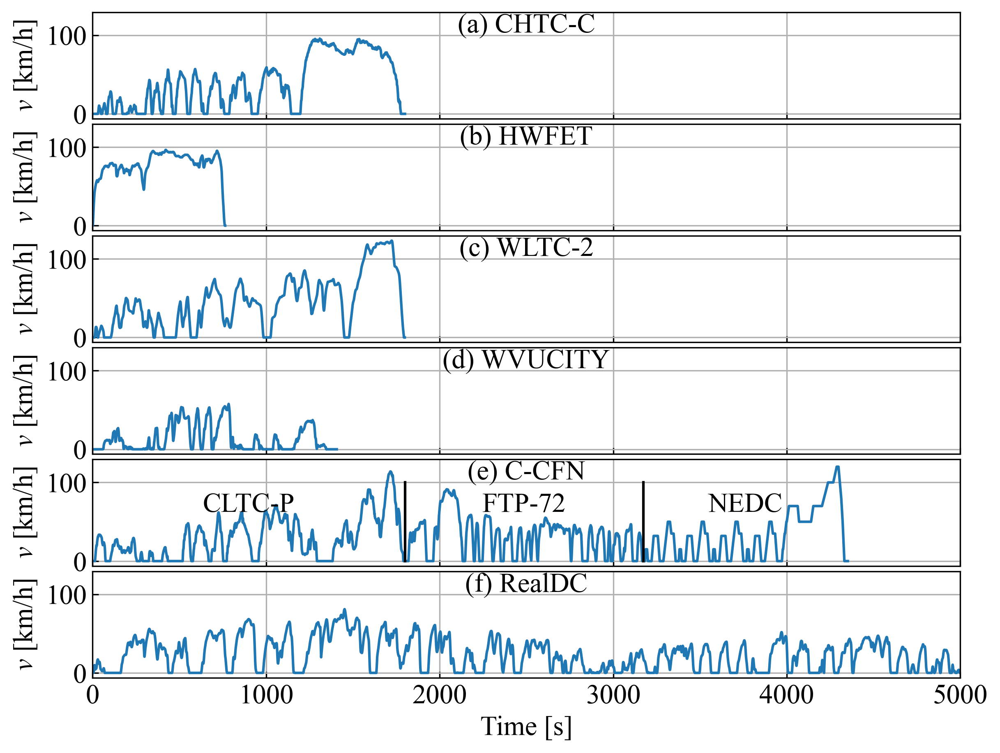

In [20]:
fig, [ax1,ax2,ax3,ax4,ax5,ax6,] = plt.subplots(6, 1, sharex=True, sharey=True, facecolor='white', figsize=(8,6), dpi=300)
fig.subplots_adjust(left=0.09, right=0.97, top=0.99, bottom=0.09,hspace=0.05,wspace=0.05)

file_name = ['(a) CHTC_C','(b) HWFET','(c) WLTC_2','(d) WVUCITY','(e) C_CFN','(f) RealDC',]
title_name = [x.replace('_', '-') for x in file_name]
loc_inf = {'horizontalalignment':'center','verticalalignment':'center_baseline',}

ax = [ax1,ax2,ax3,ax4,ax5,ax6,]
for k in range(len(file_name)):
    if k < 4:
        cycle_path = r'StandardCycle_kph_column\NewAdded\\'
    else:
        cycle_path = r'StandardCycle_kph_column\\'
    data = scio.loadmat(cycle_path + file_name[k][4:] + ".mat")
    spd_vector = np.squeeze(data[list(data.keys())[3]]) # km/h
    ax[k].plot(spd_vector)
    ax[k].set_xlim(0,len(spd_vector))
    # ax[k].set_ylim(0,max(spd_vector))
    ax[k].set_ylabel('$v$ [km/h]')
    ax[k].grid()
    ax[k].text(0.5,0.9, title_name[k],loc_inf,transform=ax[k].transAxes)
ax[-1].set_xlabel('Time [s]')
ax[-2].plot([1801]*2, [0, 100],'k')
ax[-2].plot([3173]*2, [0, 100],'k')
ax[-2].text(1801/2/5000,0.6, 'CLTC-P',loc_inf,transform=ax[-2].transAxes)
ax[-2].text(1801/5000+1372/2/5000,0.6, 'FTP-72',loc_inf,transform=ax[-2].transAxes)
ax[-2].text(1801/5000+1372/5000+1180/2/5000,0.6, 'NEDC',loc_inf,transform=ax[-2].transAxes)

fig.savefig(r"Fig\DrivingCycle.png")


## Plot EMS results

### Contrl curve

(900.0, 1000.0)

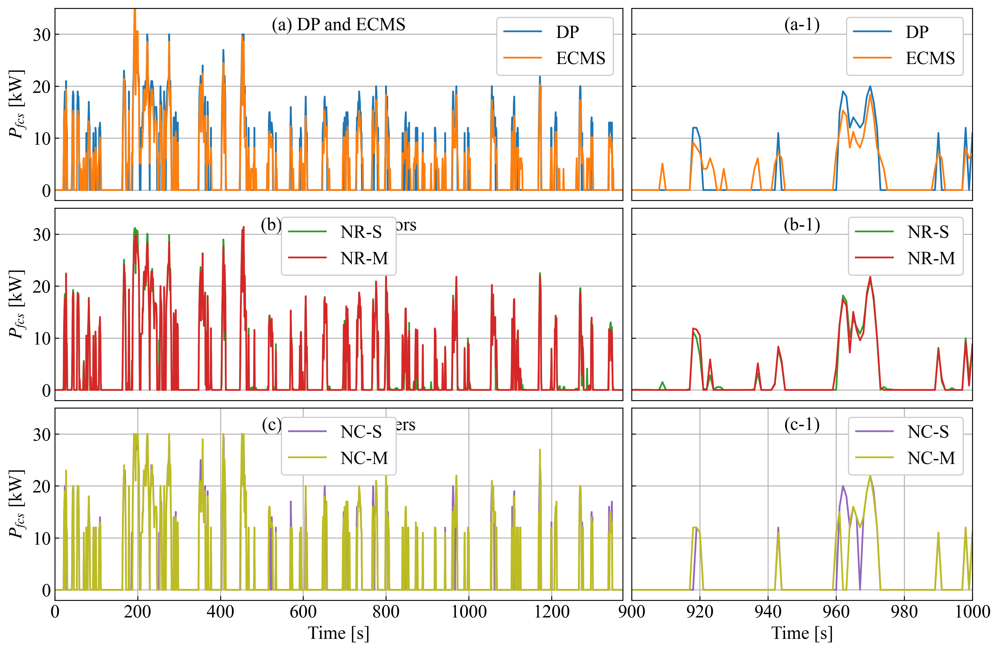

In [21]:
fig, [[ax1,ax4],[ax2,ax5,],[ax3,ax6,],] = plt.subplots(3, 2, sharex=False, sharey=True, facecolor='white',\
                                                       figsize=(12,8), dpi=300,\
                                                       gridspec_kw={'width_ratios': [2, 1.2],})
fig.subplots_adjust(left=0.06, right=0.98, top=0.96, bottom=0.07,hspace=0.04,wspace=0.02)

i = 1
p_dmd = res_all_dp[i][-2,:]
u_dp = res_all_dp[i][-1,:]
u_ecms = res_all_ecms[i]['FCS_pwr'] / 1000
u_rgr_s = res_all_rgr_s[i]['FCS_pwr'] / 1000
u_rgr_m = res_all_rgr_m[i]['FCS_pwr'] / 1000
u_cls_s = res_all_cls_s[i]['FCS_pwr'] / 1000
u_cls_m = res_all_cls_m[i]['FCS_pwr'] / 1000

x_lim_full = (0,len(p_dmd))
x_lim_local = (900,1000)
y_lim = (-2,35)
ncol_num = 1
title_name = ['(a) DP and ECMS','(b) Neural regressors','(c) Neural classifiers',]
title_name_2 = ['(a-1)','(b-1)','(c-1)',]
loc_inf = {'horizontalalignment':'center','verticalalignment':'center_baseline',}

ax1.plot(u_dp, label='DP')
ax1.plot(u_ecms, label='ECMS')
ax1.set_ylabel('$P_{fcs}$ [kW]')
ax1.legend(loc = 'best', framealpha=1, ncol=ncol_num)
ax1.grid()
ax1.text(0.5,0.92, title_name[0],loc_inf,transform=ax1.transAxes)
ax1.set_ylim(y_lim)
ax1.set_xticks([])

ax2.plot(u_rgr_s, label='NR-S',color=default_color[2])
ax2.plot(u_rgr_m, label='NR-M',color=default_color[3])
ax2.set_ylabel('$P_{fcs}$ [kW]')
ax2.legend(loc = 'best', framealpha=1, ncol=ncol_num)
ax2.grid()
ax2.text(0.5,0.92, title_name[1],loc_inf,transform=ax2.transAxes)
ax2.set_ylim(y_lim)
ax2.set_xticks([])

ax3.plot(u_cls_s, label='NC-S',color=default_color[4])
ax3.plot(u_cls_m, label='NC-M',color=default_color[8])
ax3.set_xlabel('Time [s]')
ax3.set_ylabel('$P_{fcs}$ [kW]')
ax3.legend(loc = 'best', framealpha=1, ncol=ncol_num)
ax3.grid()
ax3.text(0.5,0.92, title_name[2],loc_inf,transform=ax3.transAxes)
ax3.set_ylim(y_lim)

ax1.set_xlim(x_lim_full)
ax2.set_xlim(x_lim_full)
ax3.set_xlim(x_lim_full)

ax4.plot(u_dp, label='DP')
ax4.plot(u_ecms, label='ECMS')
ax4.legend(loc = 'best', framealpha=1, ncol=ncol_num)
ax4.grid()
ax4.text(0.5,0.92, title_name_2[0],loc_inf,transform=ax4.transAxes)
ax4.set_ylim(y_lim)
ax4.set_xticks([])

ax5.plot(u_rgr_s, label='NR-S',color=default_color[2])
ax5.plot(u_rgr_m, label='NR-M',color=default_color[3])
ax5.legend(loc = 'best', framealpha=1, ncol=ncol_num)
ax5.grid()
ax5.text(0.5,0.92, title_name_2[1],loc_inf,transform=ax5.transAxes)
ax5.set_ylim(y_lim)
ax5.set_xticks([])

ax6.plot(u_cls_s, label='NC-S',color=default_color[4])
ax6.plot(u_cls_m, label='NC-M',color=default_color[8])
ax6.set_xlabel('Time [s]')
ax6.legend(loc = 'best', framealpha=1, ncol=ncol_num)
ax6.grid()
ax6.text(0.5,0.92, title_name_2[2],loc_inf,transform=ax6.transAxes)
ax6.set_ylim(y_lim)

ax4.set_xlim(x_lim_local)
ax5.set_xlim(x_lim_local)
ax6.set_xlim(x_lim_local)

# fig.savefig(r"Fig\TrajectoryControl.png")


### CS@0.6 Power

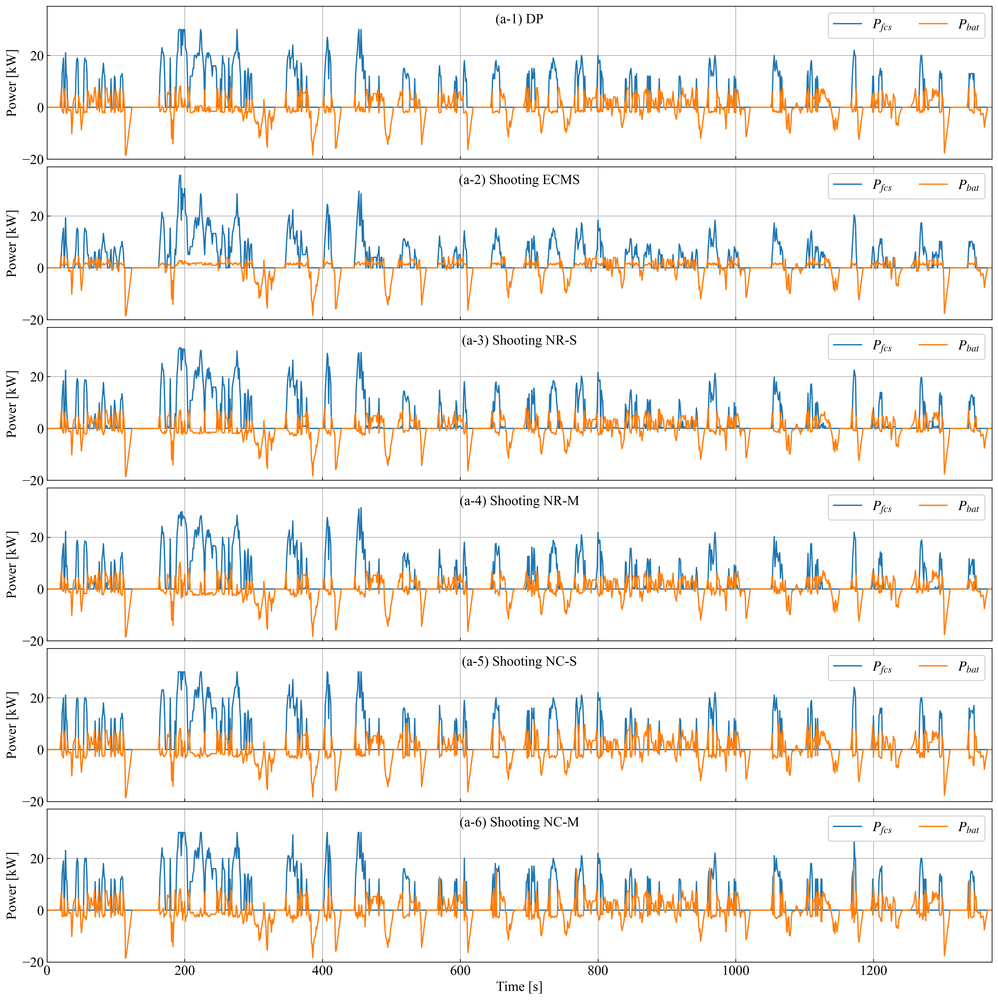

In [22]:
fig, [ax1,ax2,ax3,ax4,ax5,ax6,] = plt.subplots(6, 1, sharex=True, sharey=False, facecolor='white', figsize=(16,16), dpi=300)
fig.subplots_adjust(left=0.045, right=0.995, top=0.995, bottom=0.035,hspace=0.05,wspace=0.05)

ncol_num = 3
title_name = ['(a-1) DP','(a-2) Shooting ECMS','(a-3) Shooting NR-S','(a-4) Shooting NR-M','(a-5) Shooting NC-S','(a-6) Shooting NC-M',]
label_name = ['$P_{fcs}$','$P_{bat}$',]
loc_inf = {'horizontalalignment':'center','verticalalignment':'center_baseline',}

cycle_idx = 1
x_lim = len(res_all_dp_P_bat[cycle_idx])

ax1.plot(res_all_dp[cycle_idx][-1,:])
ax1.plot(res_all_dp_P_bat[cycle_idx])

ax2.plot(res_all_ecms[cycle_idx]['FCS_pwr'] / 1000)
ax2.plot(res_all_ecms[cycle_idx]['Bat_pwr'] / 1000)

ax3.plot(res_all_rgr_s[cycle_idx]['FCS_pwr'] / 1000)
ax3.plot(res_all_rgr_s[cycle_idx]['Bat_pwr'] / 1000)

ax4.plot(res_all_rgr_m[cycle_idx]['FCS_pwr'] / 1000)
ax4.plot(res_all_rgr_m[cycle_idx]['Bat_pwr'] / 1000)

ax5.plot(res_all_cls_s[cycle_idx]['FCS_pwr'] / 1000)
ax5.plot(res_all_cls_s[cycle_idx]['Bat_pwr'] / 1000)

ax6.plot(res_all_cls_m[cycle_idx]['FCS_pwr'] / 1000)
ax6.plot(res_all_cls_m[cycle_idx]['Bat_pwr'] / 1000)

ax6.set_xlim(0,x_lim)
ax6.set_xlabel('Time [s]')

for idx,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,]):
    ax.grid()
    ax.legend(loc = 1, framealpha=1, labels=label_name, ncol=ncol_num)
    ax.set_ylabel('Power [kW]')
    ax.set_ylim(-20,39)
    ax.text(0.5,0.92, title_name[idx],loc_inf,transform=ax.transAxes)

fig.savefig(r"Fig\TrajectoryControl.png")


In [23]:
from matplotlib.patches import ConnectionPatch

def zone_and_linked(ax,axins,zone_left,zone_right,x,y,linked='bottom',
                    x_ratio=0.05,y_ratio=0.05):
    xlim_left = x[zone_left]-(x[zone_right]-x[zone_left])*x_ratio
    xlim_right = x[zone_right]+(x[zone_right]-x[zone_left])*x_ratio

    y_data = np.hstack([yi[zone_left:zone_right] for yi in y])
    ylim_bottom = np.min(y_data)-(np.max(y_data)-np.min(y_data))*y_ratio
    ylim_top = np.max(y_data)+(np.max(y_data)-np.min(y_data))*y_ratio

    axins.set_xlim(xlim_left, xlim_right)
    axins.set_ylim(ylim_bottom, ylim_top)

    ax.plot([xlim_left,xlim_right,xlim_right,xlim_left,xlim_left],
            [ylim_bottom,ylim_bottom,ylim_top,ylim_top,ylim_bottom],"black")

    if linked == 'bottom':
        xyA_1, xyB_1 = (xlim_left,ylim_top), (xlim_left,ylim_bottom)
        xyA_2, xyB_2 = (xlim_right,ylim_top), (xlim_right,ylim_bottom)
    elif  linked == 'top':
        xyA_1, xyB_1 = (xlim_left,ylim_bottom), (xlim_left,ylim_top)
        xyA_2, xyB_2 = (xlim_right,ylim_bottom), (xlim_right,ylim_top)
    elif  linked == 'left':
        xyA_1, xyB_1 = (xlim_right,ylim_top), (xlim_left,ylim_top)
        xyA_2, xyB_2 = (xlim_right,ylim_bottom), (xlim_left,ylim_bottom)
    elif  linked == 'right':
        xyA_1, xyB_1 = (xlim_left,ylim_top), (xlim_right,ylim_top)
        xyA_2, xyB_2 = (xlim_left,ylim_bottom), (xlim_right,ylim_bottom)
        
    con = ConnectionPatch(xyA=xyA_1,xyB=xyB_1,coordsA="data",
                          coordsB="data",axesA=axins,axesB=ax)
    axins.add_artist(con)
    con = ConnectionPatch(xyA=xyA_2,xyB=xyB_2,coordsA="data",
                          coordsB="data",axesA=axins,axesB=ax)
    axins.add_artist(con)


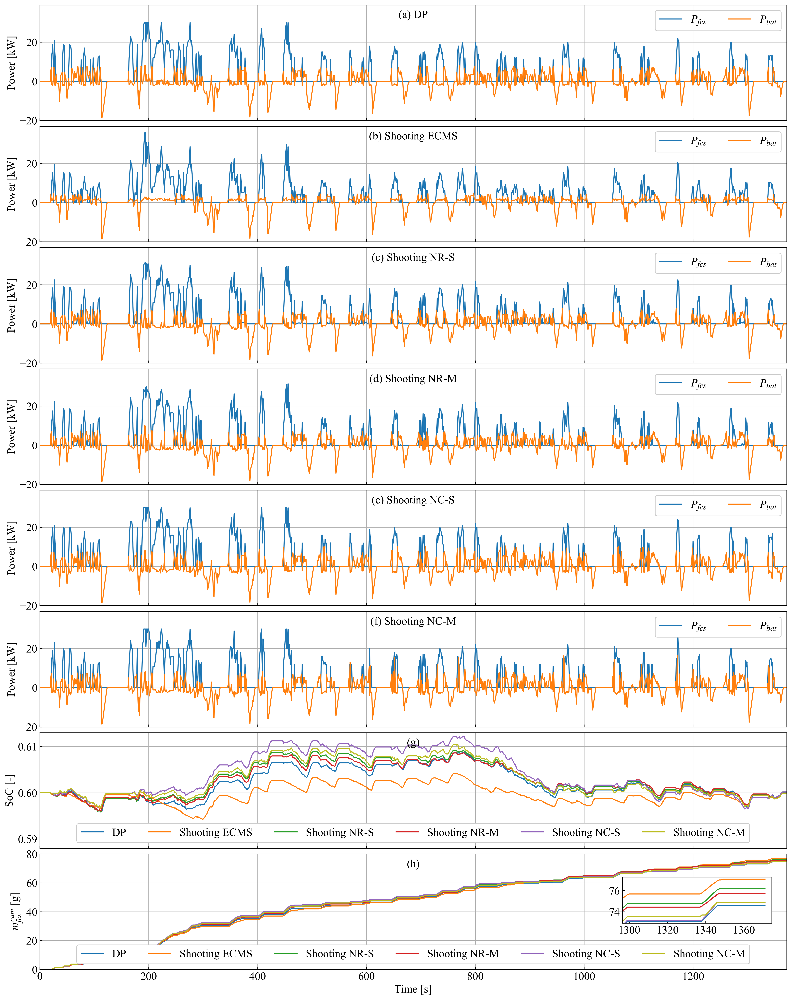

In [24]:
fig, [ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,] = plt.subplots(8, 1, sharex=True, sharey=False, facecolor='white', figsize=(16,20), dpi=300)
fig.subplots_adjust(left=0.05, right=0.985, top=0.995, bottom=0.03,hspace=0.05,wspace=0.05)

ncol_num = 3
title_name = ['(a) DP','(b) Shooting ECMS','(c) Shooting NR-S','(d) Shooting NR-M','(e) Shooting NC-S','(f) Shooting NC-M',
              '(g)','(h)',]
label_name = ['$P_{fcs}$','$P_{bat}$',]
loc_inf = {'horizontalalignment':'center','verticalalignment':'center_baseline',}

cycle_idx = 1
x_lim = len(res_all_dp_P_bat[cycle_idx])

ax1.plot(res_all_dp[cycle_idx][-1,:])
ax1.plot(res_all_dp_P_bat[cycle_idx])

ax2.plot(res_all_ecms[cycle_idx]['FCS_pwr'] / 1000)
ax2.plot(res_all_ecms[cycle_idx]['Bat_pwr'] / 1000)

ax3.plot(res_all_rgr_s[cycle_idx]['FCS_pwr'] / 1000)
ax3.plot(res_all_rgr_s[cycle_idx]['Bat_pwr'] / 1000)

ax4.plot(res_all_rgr_m[cycle_idx]['FCS_pwr'] / 1000)
ax4.plot(res_all_rgr_m[cycle_idx]['Bat_pwr'] / 1000)

ax5.plot(res_all_cls_s[cycle_idx]['FCS_pwr'] / 1000)
ax5.plot(res_all_cls_s[cycle_idx]['Bat_pwr'] / 1000)

ax6.plot(res_all_cls_m[cycle_idx]['FCS_pwr'] / 1000)
ax6.plot(res_all_cls_m[cycle_idx]['Bat_pwr'] / 1000)

for idx,ax in enumerate([ax1,ax2,ax3,ax4,ax5,ax6,]):
    ax.grid()
    ax.legend(loc = 1, framealpha=1, labels=label_name, ncol=ncol_num)
    ax.set_ylabel('Power [kW]')
    ax.set_ylim(-20,39)
    ax.text(0.5,0.92, title_name[idx],loc_inf,transform=ax.transAxes)
    
ncol_num2 = 6
label_name2 = ['DP','Shooting ECMS','Shooting NR-S','Shooting NR-M','Shooting NC-S','Shooting NC-M']

c = ax7.plot(traj_s_all[cycle_idx].T)
c[5].set_color(default_color[8])
ax7.legend(loc = 8, framealpha=1, labels=label_name2, ncol=ncol_num2)
ax7.grid()
ax7.set_ylabel('SoC [-]')
ax7.text(0.5,0.92, title_name[6],loc_inf,transform=ax7.transAxes)
ax7.set_ylim(0.588,0.613)

c = ax8.plot(traj_m_all[cycle_idx].T)
c[5].set_color(default_color[8])
ax8.legend(loc = 8, framealpha=1, labels=label_name2, ncol=ncol_num2)
ax8.grid()
ax8.set_ylabel('$m_{fcs}^{cum}$ [g]')
ax8.text(0.5,0.92, title_name[7],loc_inf,transform=ax8.transAxes)
ax8.set_ylim(0,80)

axins = ax8.inset_axes((0.78, 0.4, 0.2, 0.4))
c = axins.plot(traj_m_all[cycle_idx].T)
c[5].set_color(default_color[8])
yy = [np.array(y) for y in traj_m_all[cycle_idx]]
zone_and_linked(ax, axins, 1300, 1371, range(len(yy[cycle_idx][:])), yy, 'right')


ax8.set_xlim(0,x_lim)
ax8.set_xlabel('Time [s]')

fig.savefig(r"Fig\TrajectoryCS.png")


### CS@0.6 SoC

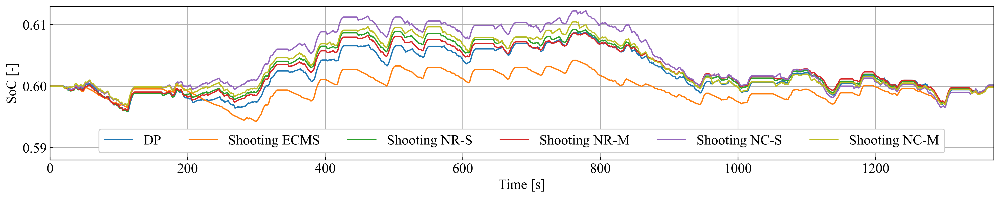

In [25]:
fig, ax1, = plt.subplots(1, 1, sharex=False, sharey=False, facecolor='white', figsize=(16,3), dpi=300)
fig.subplots_adjust(left=0.055, right=0.995, top=0.99, bottom=0.17,hspace=0.05,wspace=0.05)

ncol_num = 6
label_name = ['DP','Shooting ECMS','Shooting NR-S','Shooting NR-M','Shooting NC-S','Shooting NC-M']
loc_inf = {'horizontalalignment':'left','verticalalignment':'center_baseline',}

cycle_idx = 1
x_lim = len(res_all_dp_P_bat[cycle_idx])

c = ax1.plot(traj_s_all[cycle_idx].T)
c[5].set_color(default_color[8])
ax1.legend(loc = 8, framealpha=1, labels=label_name, ncol=ncol_num)
ax1.grid()
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('SoC [-]')
ax1.set_xlim(0,x_lim)
ax1.set_ylim(0.588,0.613)

fig.savefig(r"Fig\TrajectoryState.png")


### CD@0.7-0.5 Power

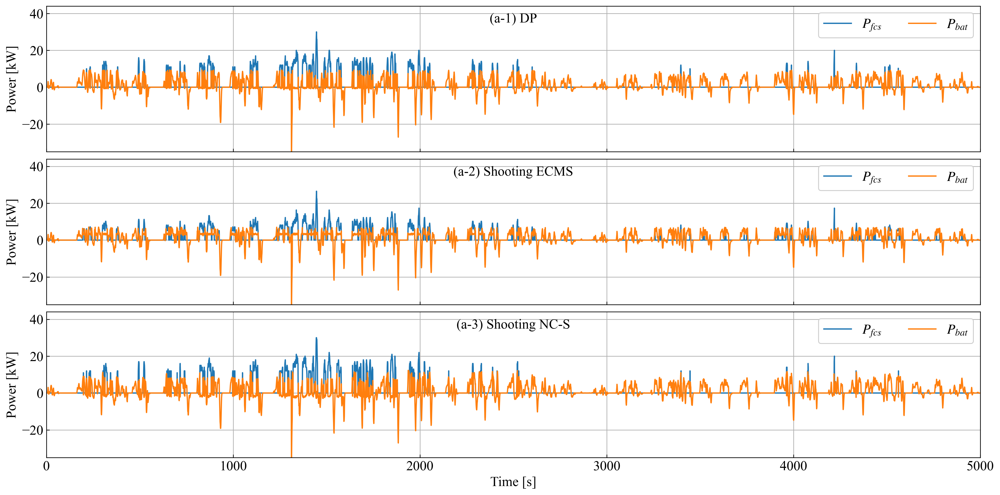

In [26]:
fig, [ax1,ax2,ax3,] = plt.subplots(3, 1, sharex=True, sharey=False, facecolor='white', figsize=(16,8), dpi=300)
fig.subplots_adjust(left=0.045, right=0.995, top=0.99, bottom=0.07,hspace=0.05,wspace=0.05)

title_name = ['(a-1) DP','(a-2) Shooting ECMS','(a-3) Shooting NC-S',]
label_name = ['$P_{fcs}$','$P_{bat}$',]
loc_inf = {'horizontalalignment':'center','verticalalignment':'center_baseline',}

cycle_idx = 1
x_lim = len(res_all_dp_P_bat_CD[cycle_idx])

ax1.plot(res_all_dp_CD[cycle_idx][-1,:])
ax1.plot(res_all_dp_P_bat_CD[cycle_idx])

ax2.plot(res_all_ecms_CD[cycle_idx]['FCS_pwr'] / 1000)
ax2.plot(res_all_ecms_CD[cycle_idx]['Bat_pwr'] / 1000)

ax3.plot(res_all_cls_s_CD[cycle_idx]['FCS_pwr'] / 1000)
ax3.plot(res_all_cls_s_CD[cycle_idx]['Bat_pwr'] / 1000)

ax3.set_xlim(0,x_lim)
ax3.set_xlabel('Time [s]')

for idx,ax in enumerate([ax1,ax2,ax3,]):
    ax.grid()
    ax.legend(loc = 0, framealpha=1, labels=label_name, ncol=2)
    ax.set_ylabel('Power [kW]')
    ax.set_ylim(-35,44)
    ax.text(0.5,0.92, title_name[idx],loc_inf,transform=ax.transAxes)

fig.savefig(r"Fig\TrajectoryControlCD.png")


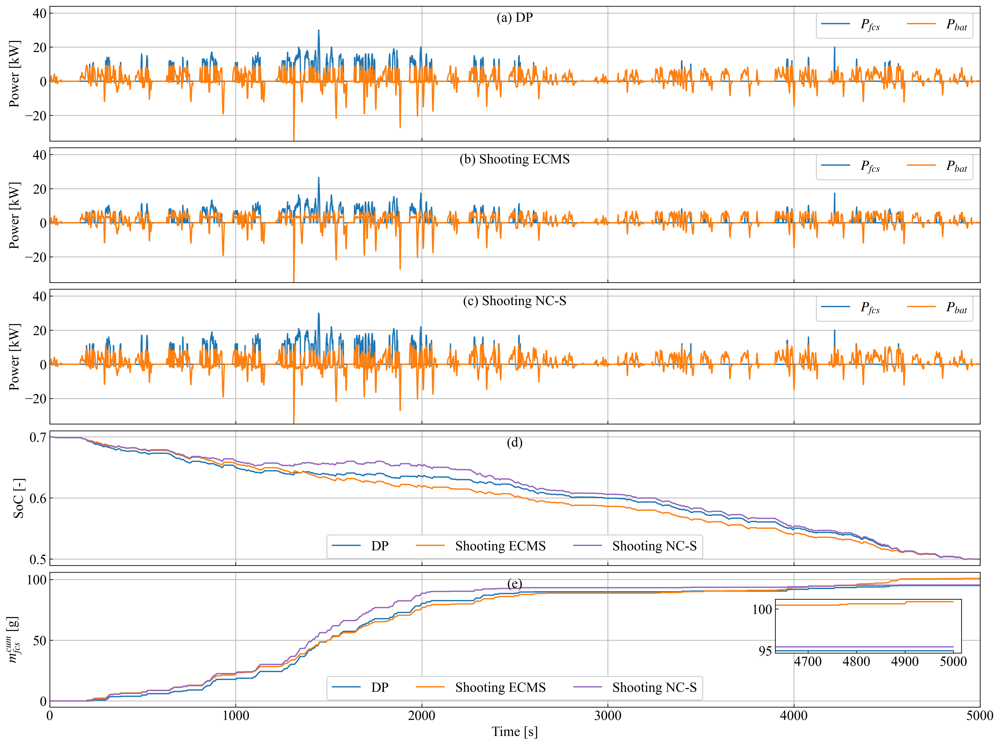

In [27]:
fig, [ax1,ax2,ax3,ax7,ax8,] = plt.subplots(5, 1, sharex=True, sharey=False, facecolor='white', figsize=(16,12), dpi=300)
fig.subplots_adjust(left=0.05, right=0.985, top=0.99, bottom=0.05,hspace=0.05,wspace=0.05)

title_name = ['(a) DP','(b) Shooting ECMS','(c) Shooting NC-S','(d)','(e)',]
label_name = ['$P_{fcs}$','$P_{bat}$',]
loc_inf = {'horizontalalignment':'center','verticalalignment':'center_baseline',}

cycle_idx = 1
x_lim = len(res_all_dp_P_bat_CD[cycle_idx])

ax1.plot(res_all_dp_CD[cycle_idx][-1,:])
ax1.plot(res_all_dp_P_bat_CD[cycle_idx])

ax2.plot(res_all_ecms_CD[cycle_idx]['FCS_pwr'] / 1000)
ax2.plot(res_all_ecms_CD[cycle_idx]['Bat_pwr'] / 1000)

ax3.plot(res_all_cls_s_CD[cycle_idx]['FCS_pwr'] / 1000)
ax3.plot(res_all_cls_s_CD[cycle_idx]['Bat_pwr'] / 1000)

for idx,ax in enumerate([ax1,ax2,ax3,]):
    ax.grid()
    ax.legend(loc = 0, framealpha=1, labels=label_name, ncol=2)
    ax.set_ylabel('Power [kW]')
    ax.set_ylim(-35,44)
    ax.text(0.5,0.92, title_name[idx],loc_inf,transform=ax.transAxes)


ncol_num2 = 3
label_name2 = ['DP','Shooting ECMS','Shooting NR-S','Shooting NR-M','Shooting NC-S','Shooting NC-M']

c = ax7.plot(traj_s_all_CD[cycle_idx][[0,1,4]].T)
c[-1].set_color(default_color[4])
ax7.legend(loc = 8, framealpha=1, labels=[label_name2[0],label_name2[1],label_name2[4]], ncol=ncol_num2)
ax7.grid()
ax7.set_ylabel('SoC [-]')
ax7.text(0.5,0.92, title_name[3],loc_inf,transform=ax7.transAxes)
# ax7.set_ylim(0.588,0.613)

c = ax8.plot(traj_m_all_CD[cycle_idx][[0,1,4]].T)
c[-1].set_color(default_color[4])
ax8.legend(loc = 8, framealpha=1, labels=[label_name2[0],label_name2[1],label_name2[4]], ncol=ncol_num2)
ax8.grid()
ax8.set_ylabel('$m_{fcs}^{cum}$ [g]')
ax8.text(0.5,0.92, title_name[4],loc_inf,transform=ax8.transAxes)
# ax8.set_ylim(0,80)

axins = ax8.inset_axes((0.78, 0.4, 0.2, 0.4))
c = axins.plot(traj_m_all_CD[cycle_idx][[0,1,4]].T)
c[-1].set_color(default_color[4])
yy = [np.array(y) for y in traj_m_all_CD[cycle_idx][[0,1,4]]]
zone_and_linked(ax, axins, 4650, 4999, range(len(yy[cycle_idx][:])), yy, 'right')

ax8.set_xlim(0,x_lim)
ax8.set_xlabel('Time [s]')


fig.savefig(r"Fig\TrajectoryCSCD.png")


### CD@0.7-0.5 SoC

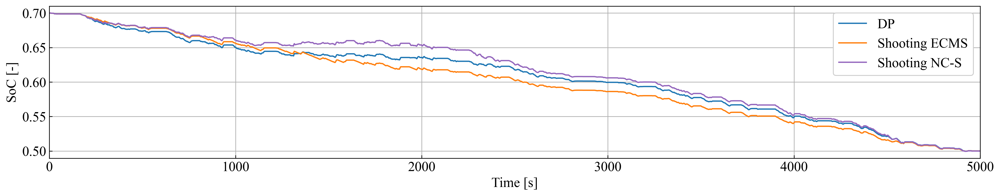

In [28]:
fig, ax1, = plt.subplots(1, 1, sharex=False, sharey=False, facecolor='white', figsize=(16,3), dpi=300)
fig.subplots_adjust(left=0.055, right=0.995, top=0.99, bottom=0.17,hspace=0.05,wspace=0.05)

ncol_num = 1
label_name = ['DP','Shooting ECMS','Shooting NR-S','Shooting NR-M','Shooting NC-S','Shooting NC-M']
loc_inf = {'horizontalalignment':'left','verticalalignment':'center_baseline',}

# cycle_idx = 1
x_lim = len(res_all_dp_P_bat_CD[cycle_idx])

c = ax1.plot(traj_s_all_CD[cycle_idx][[0,1,4]].T)
c[-1].set_color(default_color[4])
ax1.legend(loc = 0, framealpha=1, labels=[label_name[0],label_name[1],label_name[4]], ncol=ncol_num)
ax1.grid()
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('SoC [-]')
ax1.set_xlim(0,x_lim)
# ax1.set_ylim(0.588,0.613)

fig.savefig(r"Fig\TrajectoryStateCD.png")


### CS@0.6 SoC all cycles all methods

Text(0.9, 0.92, '(c) NEDC')

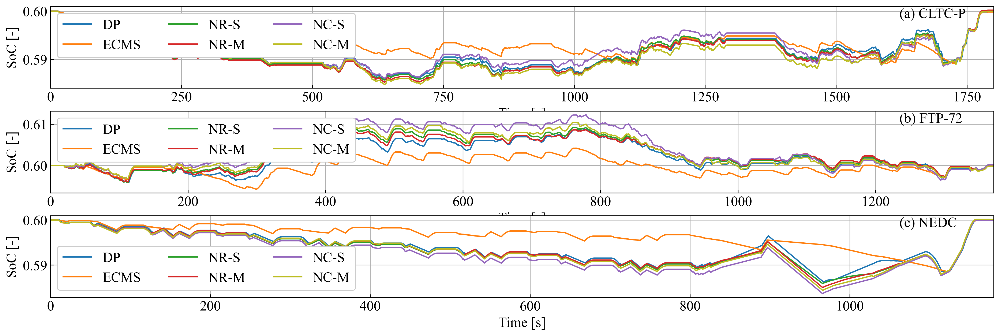

In [29]:
fig, [ax1,ax2,ax3,] = plt.subplots(3, 1, sharex=False, sharey=False, facecolor='white', figsize=(16,5), dpi=300)
fig.subplots_adjust(left=0.06, right=0.99, top=0.99, bottom=0.07,hspace=0.28,wspace=0.05)

ncol_num = 3
label_name = ['DP','ECMS','NR-S','NR-M','NC-S','NC-M']
title_name = ['(a) CLTC-P','(b) FTP-72','(c) NEDC',]
loc_inf = {'horizontalalignment':'left','verticalalignment':'center_baseline',}

c = ax1.plot(traj_s_all[0].T)
c[5].set_color(default_color[8])
ax1.set_ylabel('SoC [-]')
ax1.legend(loc = 2, framealpha=1, labels=label_name, ncol=ncol_num)
ax1.grid()
ax1.set_xlabel('Time [s]')
ax1.set_xlim(0,len(traj_s_all[0][0]))
# ax1.set_ylim(0.58,0.618)
ax1.text(0.90,0.92, title_name[0],loc_inf,transform=ax1.transAxes)

c = ax2.plot(traj_s_all[1].T)
c[5].set_color(default_color[8])
ax2.set_ylabel('SoC [-]')
ax2.legend(loc = 2, framealpha=1, labels=label_name, ncol=ncol_num)
ax2.grid()
ax2.set_xlabel('Time [s]')
ax2.set_xlim(0,len(traj_s_all[1][0]))
# ax2.set_ylim(0.59,0.652)
ax2.text(0.90,0.92, title_name[1],loc_inf,transform=ax2.transAxes)

c = ax3.plot(traj_s_all[3].T)
c[5].set_color(default_color[8])
ax3.set_ylabel('SoC [-]')
ax3.legend(loc = 'best', framealpha=1, labels=label_name, ncol=ncol_num)
ax3.grid()
ax3.set_xlabel('Time [s]')
ax3.set_xlim(0,len(traj_s_all[3][0]))
# ax3.set_ylim(0.58,0.618)
ax3.text(0.90,0.92, title_name[2],loc_inf,transform=ax3.transAxes)

# fig.savefig(r"Fig\TrajectoryState.png")


### CS@0.6 SoC all cycles DP+ECMS+NC-M

Text(0.85, 0.92, '(c) NEDC')

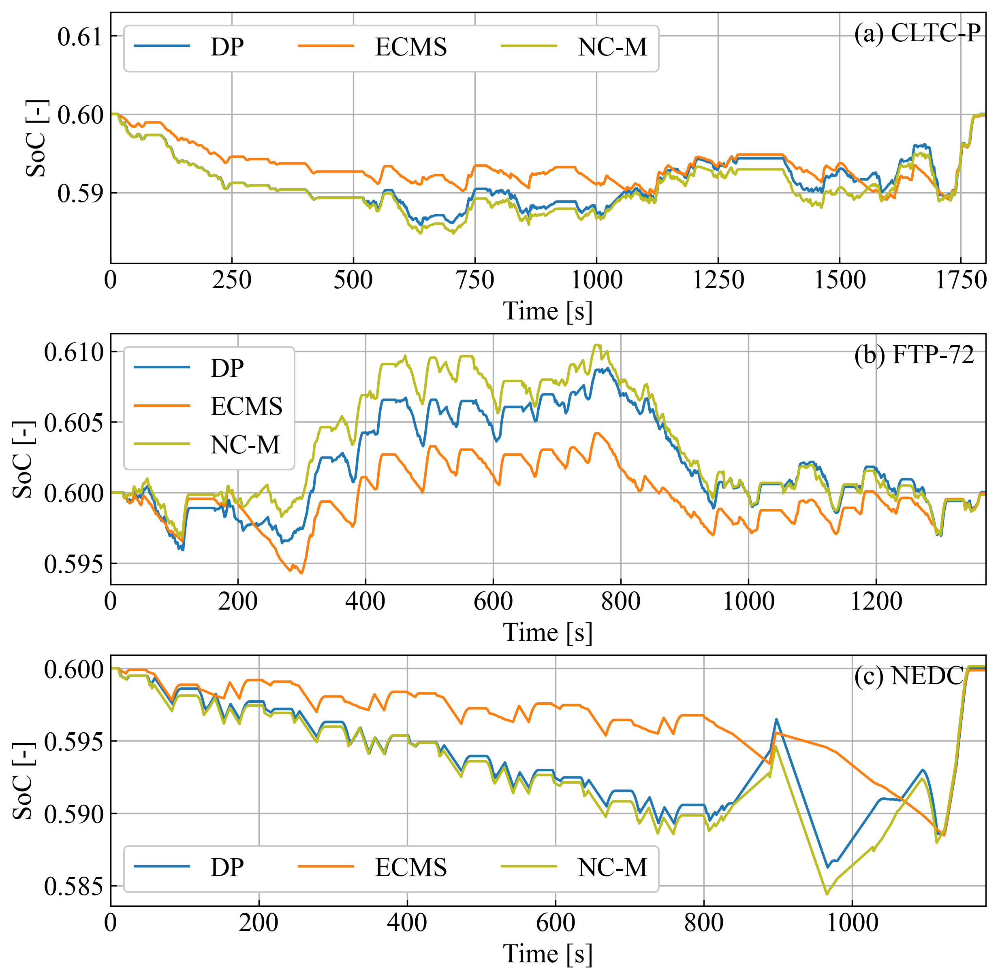

In [30]:
fig, [ax1,ax2,ax3,] = plt.subplots(3, 1, sharex=False, sharey=False, facecolor='white', figsize=(8,8), dpi=300)
fig.subplots_adjust(left=0.09, right=0.99, top=0.99, bottom=0.07,hspace=0.28,wspace=0.05)

ncol_num = 3
label_name = ['DP','ECMS','NC-M']
title_name = ['(a) CLTC-P','(b) FTP-72','(c) NEDC',]
loc_inf = {'horizontalalignment':'left','verticalalignment':'center_baseline',}
idx_list = [0,1,5,]

c = ax1.plot(traj_s_all[0][idx_list].T)
c[-1].set_color(default_color[8])
ax1.set_ylabel('SoC [-]')
ax1.legend(loc = 2, framealpha=1, labels=label_name, ncol=ncol_num)
ax1.grid()
ax1.set_xlabel('Time [s]')
ax1.set_xlim(0,len(traj_s_all[0][0]))
ax1.set_ylim(0.581,0.613)
ax1.text(0.85,0.92, title_name[0],loc_inf,transform=ax1.transAxes)

c = ax2.plot(traj_s_all[1][idx_list].T)
c[-1].set_color(default_color[8])
ax2.set_ylabel('SoC [-]')
ax2.legend(loc = 2, framealpha=1, labels=label_name, ncol=1)
ax2.grid()
ax2.set_xlabel('Time [s]')
ax2.set_xlim(0,len(traj_s_all[1][0]))
# ax2.set_ylim(0.59,0.652)
ax2.text(0.85,0.92, title_name[1],loc_inf,transform=ax2.transAxes)

c = ax3.plot(traj_s_all[3][idx_list].T)
c[-1].set_color(default_color[8])
ax3.set_ylabel('SoC [-]')
ax3.legend(loc = 'best', framealpha=1, labels=label_name, ncol=ncol_num)
ax3.grid()
ax3.set_xlabel('Time [s]')
ax3.set_xlim(0,len(traj_s_all[3][0]))
# ax3.set_ylim(0.58,0.618)
ax3.text(0.85,0.92, title_name[2],loc_inf,transform=ax3.transAxes)

# fig.savefig(r"Fig\TrajectoryState.png")


## Adaptive NeuralEMS

### NN_PI

Final soc is: 0.608357; Fuel cost is: 101.30 g, Time cost is 1.12 s, optimal SOC_tgt is 0.600188.
Final soc is: 0.600468; Fuel cost is: 76.76 g, Time cost is 0.87 s, optimal SOC_tgt is 0.402307.
Final soc is: 0.586482; Fuel cost is: 62.22 g, Time cost is 0.85 s, optimal SOC_tgt is 0.395040.
Final soc is: 0.609057; Fuel cost is: 81.37 g, Time cost is 0.72 s, optimal SOC_tgt is 0.498776.
************************************************************
Final soc is: 0.607482; Fuel cost is: 99.49 g, Time cost is 1.11 s, optimal SOC_tgt is 0.613969.
Final soc is: 0.596082; Fuel cost is: 74.50 g, Time cost is 0.89 s, optimal SOC_tgt is 0.545729.
Final soc is: 0.587558; Fuel cost is: 61.15 g, Time cost is 0.88 s, optimal SOC_tgt is 0.398587.
Final soc is: 0.613443; Fuel cost is: 82.97 g, Time cost is 0.73 s, optimal SOC_tgt is 0.397690.
************************************************************
Final soc is: 0.608165; Fuel cost is: 100.91 g, Time cost is 1.16 s, optimal SOC_tgt is 0.648744.
Fin

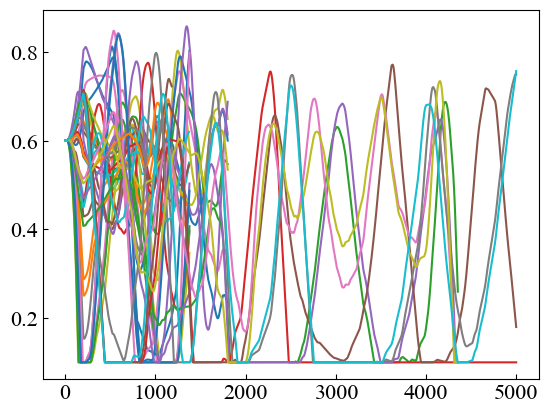

In [73]:
names = ['rgr_s','rgr_m','cls_s','cls_m',]

modes = ['CS@60','CS@90','CD@70-50',]

for mode in modes:
    if mode == modes[2]:
        cycles = ('C_CFN', 'RealDC', )
        cycle_path = r'StandardCycle_kph_column\NewAdded\\'
        soc_i = 0.7
        soc_o = 0.5
    else:
        cycles = ('CLTC_P', 'FTP_72', 'JC08', 'NEDC',)
        cycle_path = r'StandardCycle_kph_column\\'
        if mode == modes[0]:
            soc_i = 0.6
            soc_o = 0.6
        else:
            soc_i = 0.9
            soc_o = 0.9

    writer = pd.ExcelWriter(r'Results\Results_all'+'_'+mode+'_PI.xlsx')
    for h in range(len(model_list)):
        Results_all = np.zeros([len(cycles),3])
        res_all = []

        num_step_backward = num_step_backward_list[h]
        num_step_forward = num_step_backward
        model = model_list[h]
        name = names[h]
        for k in range(len(cycles)):#[2,]:#
            # load data
            data = scio.loadmat(cycle_path + cycles[k] + ".mat")
            spd_vector = np.squeeze(data[list(data.keys())[3]]) / 3.6 #['__header__', '__version__', '__globals__', 'CLTC_P']
            acc_vector = np.append(np.diff(spd_vector,axis=0),0)
            dis_vector = np.cumsum(spd_vector) / np.sum(spd_vector)
            dmd_result = FCV.run_Pdmd(spd_vector,acc_vector)
            dmd_vector = dmd_result['P_dem_m'] / 1000
            spd_length = spd_vector.size

            time_start = time.time()

            soc_ini = soc_i
            soc_tgt = 0.6  # note here
            soc_tgt_list = [soc_tgt, ]
            soc = soc_ini
            res = {}
            k_p = 0.2
            k_i = 0.01

            for i in range(spd_length):
                idx = np.clip( np.arange(i-num_step_backward,i+num_step_forward+1),0,spd_length-1 )
                spd = spd_vector[i]
                acc = acc_vector[i]
                dis = dis_vector[i]
                pwr_dmd = dmd_vector[idx]
                input_x = np.reshape(np.concatenate([np.array([spd,acc,soc,soc_tgt,dis]),pwr_dmd]),(1,-1))
                fcs_pwr = np.clip(model.predict(input_x)[0],0,50)
                out = FCV.run(spd,acc,soc,fcs_pwr * 1000)

                soc = out['Bat_soc']

                if i==0:
                    res.update(out)
                else:
                    for key,value in out.items():
                        res[key] = np.concatenate((res[key],value))

                soc_d_list = soc_i+dis_vector[0:i+1]*(soc_o-soc_i)-res['Bat_soc']
                if len(soc_d_list)>200:
                    soc_d_list = soc_d_list[-200:0]
                soc_tgt = np.clip(soc_tgt+k_p*(soc_i+dis*(soc_o-soc_i)-soc)+k_i*np.sum(soc_d_list),0.1,1)[0]
                soc_tgt_list.append(soc_tgt)
                
            time_end = time.time()
            time_cost = time_end - time_start

            Final_SOC = res['Bat_soc'][-1]
            H2_cost = np.sum(res['FC_fuel'])
            Results_all[k,:] = [time_cost, Final_SOC, H2_cost]
            print(f"Final soc is: {Final_SOC:.6f}; Fuel cost is: {H2_cost:.2f} g, Time cost is {time_cost:.2f} s, optimal SOC_tgt is {soc_tgt:.6f}.")

            res_all.append(res)
            plt.plot(soc_tgt_list)

        print('*'*60)
        joblib.dump(res_all, r'Results\res_all_'+name+'_'+mode+'_PI.pkl')
        df = pd.DataFrame(Results_all)
        df.to_excel(writer,sheet_name=name)
        writer.save()


### ECMS_PI

Final soc is: 0.610634; Fuel cost is: 102.63 g, Time cost is 0.94 s, optimal k is 0.5708.
Final soc is: 0.599586; Fuel cost is: 77.08 g, Time cost is 0.69 s, optimal k is 0.8787.
Final soc is: 0.606961; Fuel cost is: 69.63 g, Time cost is 0.68 s, optimal k is 0.6290.
Final soc is: 0.610756; Fuel cost is: 83.92 g, Time cost is 0.56 s, optimal k is 0.8143.
************************************************************
Final soc is: 0.910139; Fuel cost is: 102.65 g, Time cost is 0.91 s, optimal k is 0.2000.
Final soc is: 0.900806; Fuel cost is: 77.89 g, Time cost is 0.70 s, optimal k is 0.7722.
Final soc is: 0.906577; Fuel cost is: 69.70 g, Time cost is 0.68 s, optimal k is 0.9027.
Final soc is: 0.910083; Fuel cost is: 83.86 g, Time cost is 0.58 s, optimal k is 0.6245.
************************************************************
Final soc is: 0.517658; Fuel cost is: 170.00 g, Time cost is 2.26 s, optimal k is 0.2000.
Final soc is: 0.498241; Fuel cost is: 101.94 g, Time cost is 2.64 s, optim

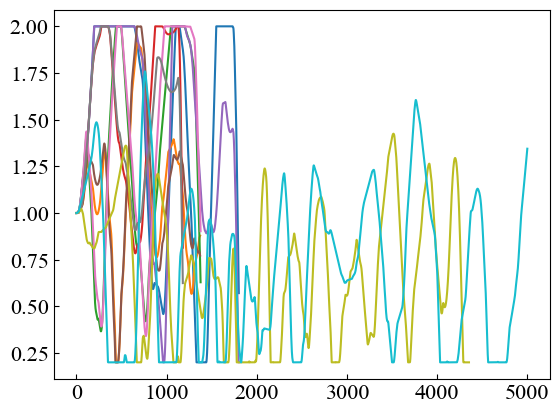

In [74]:
from ECMS_Class import ECMS
modes = ['CS@60','CS@90','CD@70-50',]

for mode in modes:
    if mode == modes[2]:
        cycles = ('C_CFN', 'RealDC', )
        cycle_path = r'StandardCycle_kph_column\NewAdded\\'
        soc_i = 0.7
        soc_o = 0.5
    else:
        cycles = ('CLTC_P', 'FTP_72', 'JC08', 'NEDC',)
        cycle_path = r'StandardCycle_kph_column\\'
        if mode == modes[0]:
            soc_i = 0.6
            soc_o = 0.6
        else:
            soc_i = 0.9
            soc_o = 0.9

    Results_all = np.zeros([len(cycles),3])
    res_all = []


    writer = pd.ExcelWriter(r'Results\Results_all'+'_'+mode+'_ECMS_PI.xlsx')
    for k in range(len(cycles)):#[0,]:#
        data = scio.loadmat(cycle_path + cycles[k] + ".mat")
        veh_spd = np.squeeze(data[list(data.keys())[3]]) / 3.6 #['__header__', '__version__', '__globals__', 'CLTC_P']
        veh_acc = np.append(np.diff(veh_spd,axis=0),0)
        dis_vector = np.cumsum(veh_spd) / np.sum(veh_spd)
        ECMS_1 = ECMS(veh_spd,veh_acc,soc_ini = soc_i,soc_tgt = soc_o,grid_u=50)

        time_start = time.time()

        soc = soc_i
        soc_vector_i = np.array([soc_i,])

        res = {}

        k_opt = np.array([1,])
        k_opt_list = [k_opt[0],]
        k_p = 3
        k_i = 0.01

        for i in range(veh_spd.size):
            spd = veh_spd[i]
            acc = veh_acc[i]
            dis = dis_vector[i]

            soc_d_list = soc_i+dis_vector[0:i+1]*(soc_o-soc_i)-soc_vector_i
            if len(soc_d_list)>200:
                soc_d_list = soc_d_list[-200:0]
            k_opt = np.clip(k_opt+k_p*(soc_i+dis*(soc_o-soc_i)-soc)+k_i*np.sum(soc_d_list),0.2,2)[0]
            k_opt_list.append(k_opt)
            res_step = ECMS_1.opti_step(spd,acc,soc,k_opt)

            for key,value in res_step.items(): # unified output
                if type(value) is not np.ndarray:
                    res_step[key] = np.array([value,])
                elif value.shape is ():
                    res_step[key] = np.array([value+0,])

            if i==0:
                res.update(res_step)
            else:
                for key,value in res_step.items():
                    res[key] = np.concatenate((res[key],value))

            soc = res_step['Bat_soc']
            soc_vector_i = np.append(soc_vector_i,soc)

        time_end = time.time()
        time_cost = time_end - time_start

        Final_SOC = res['Bat_soc'][-1]
        H2_cost = np.sum(res['FC_fuel'])
        Results_all[k,:] = [time_cost, Final_SOC, H2_cost]
        print(f"Final soc is: {Final_SOC:.6f}; Fuel cost is: {H2_cost:.2f} g, Time cost is {time_cost:.2f} s, optimal k is {k_opt:.4f}.")

        res_all.append(res)
        plt.plot(k_opt_list)

    print('*'*60)
    joblib.dump(res_all, r'Results\res_all_ecms_'+mode+'_PI.pkl')
    df = pd.DataFrame(Results_all)
    df.to_excel(writer,sheet_name='ECMS')
    writer.save()

### Load results

In [75]:
res_all_rgr_s_CS60_PI = joblib.load(r"Results\res_all_rgr_s_CS@60_PI.pkl")
res_all_rgr_m_CS60_PI = joblib.load(r"Results\res_all_rgr_m_CS@60_PI.pkl")
res_all_cls_s_CS60_PI = joblib.load(r"Results\res_all_cls_s_CS@60_PI.pkl")
res_all_cls_m_CS60_PI = joblib.load(r"Results\res_all_cls_m_CS@60_PI.pkl")
res_all_ecms_CS60_PI = joblib.load(r"Results\res_all_ecms_CS@60_PI.pkl")

res_all_rgr_s_CS90_PI = joblib.load(r"Results\res_all_rgr_s_CS@90_PI.pkl")
res_all_rgr_m_CS90_PI = joblib.load(r"Results\res_all_rgr_m_CS@90_PI.pkl")
res_all_cls_s_CS90_PI = joblib.load(r"Results\res_all_cls_s_CS@90_PI.pkl")
res_all_cls_m_CS90_PI = joblib.load(r"Results\res_all_cls_m_CS@90_PI.pkl")
res_all_ecms_CS90_PI = joblib.load(r"Results\res_all_ecms_CS@90_PI.pkl")

In [76]:
res_all_rgr_s_CD_PI = joblib.load(r"Results\res_all_rgr_s_CD@70-50_PI.pkl")
res_all_rgr_m_CD_PI = joblib.load(r"Results\res_all_rgr_m_CD@70-50_PI.pkl")
res_all_cls_s_CD_PI = joblib.load(r"Results\res_all_cls_s_CD@70-50_PI.pkl")
res_all_cls_m_CD_PI = joblib.load(r"Results\res_all_cls_m_CD@70-50_PI.pkl")
res_all_ecms_CD_PI = joblib.load(r"Results\res_all_ecms_CD@70-50_PI.pkl")


### get u and x

In [77]:
traj_s_all_CS60_PI = []
traj_s_all_CS90_PI = []
traj_s_all_CD_PI = []

for i in range(4): # each cycle, dp+ecms+nn
    s_ecms = res_all_ecms_CS60_PI[i]['Bat_soc']
    s_rgr_s = res_all_rgr_s_CS60_PI[i]['Bat_soc']
    s_rgr_m = res_all_rgr_m_CS60_PI[i]['Bat_soc']
    s_cls_s = res_all_cls_s_CS60_PI[i]['Bat_soc']
    s_cls_m = res_all_cls_m_CS60_PI[i]['Bat_soc']
    traj_s_all_CS60_PI.append(np.reshape(np.concatenate([s_ecms,s_rgr_s,s_rgr_m,s_cls_s,s_cls_m]),(5,-1)))
    
    s_ecms_CS90_PI = res_all_ecms_CS90_PI[i]['Bat_soc']
    s_rgr_s_CS90_PI = res_all_rgr_s_CS90_PI[i]['Bat_soc']
    s_rgr_m_CS90_PI = res_all_rgr_m_CS90_PI[i]['Bat_soc']
    s_cls_s_CS90_PI = res_all_cls_s_CS90_PI[i]['Bat_soc']
    s_cls_m_CS90_PI = res_all_cls_m_CS90_PI[i]['Bat_soc']
    traj_s_all_CS90_PI.append(np.reshape(np.concatenate([s_ecms_CS90_PI,s_rgr_s_CS90_PI,s_rgr_m_CS90_PI,s_cls_s_CS90_PI,s_cls_m_CS90_PI]),(5,-1)))
    
    
for i in range(2): # each cycle, dp+ecms+nn
    s_ecms_CD_PI = res_all_ecms_CD_PI[i]['Bat_soc']
    s_rgr_s_CD_PI = res_all_rgr_s_CD_PI[i]['Bat_soc']
    s_rgr_m_CD_PI = res_all_rgr_m_CD_PI[i]['Bat_soc']
    s_cls_s_CD_PI = res_all_cls_s_CD_PI[i]['Bat_soc']
    s_cls_m_CD_PI = res_all_cls_m_CD_PI[i]['Bat_soc']
    traj_s_all_CD_PI.append(np.reshape(np.concatenate([s_ecms_CD_PI,s_rgr_s_CD_PI,s_rgr_m_CD_PI,s_cls_s_CD_PI,s_cls_m_CD_PI]),(5,-1)))

## Plot PI

### CS@0.6 SoC

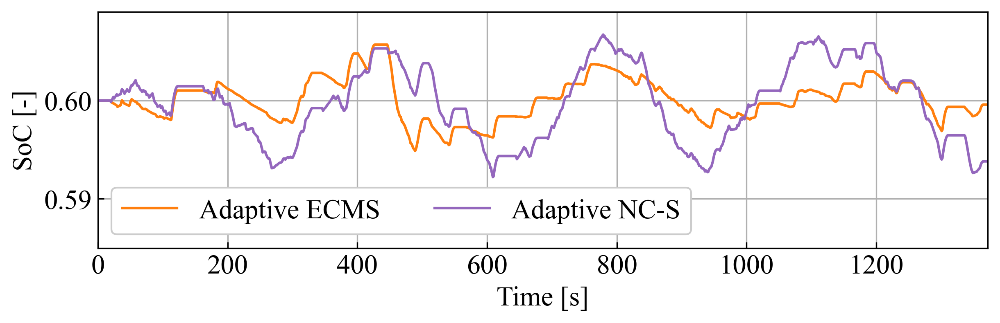

In [78]:
fig, ax1, = plt.subplots(1, 1, sharex=False, sharey=False, facecolor='white', figsize=(8,2.5), dpi=300)
fig.subplots_adjust(left=0.09, right=0.995, top=0.99, bottom=0.22,hspace=0.05,wspace=0.05)

ncol_num = 2
label_name = ['Adaptive ECMS','Adaptive NR-S','Adaptive NR-M','Adaptive NC-S','Adaptive NC-M']
loc_inf = {'horizontalalignment':'left','verticalalignment':'center_baseline',}

cycle_idx = 1
x_lim = len(traj_s_all_CS60_PI[cycle_idx][0])

c = ax1.plot(traj_s_all_CS60_PI[cycle_idx][[0,3],:].T)
c[0].set_color(default_color[1])
# c[1].set_color(default_color[2])
# c[2].set_color(default_color[3])
c[-1].set_color(default_color[4])
# c[4].set_color(default_color[8])
ax1.legend(loc = 0, framealpha=1, labels=[label_name[0],label_name[3]], ncol=ncol_num)
ax1.grid()
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('SoC [-]')
ax1.set_xlim(0,x_lim)
ax1.set_ylim(0.585,0.609)

fig.savefig(r"Fig\TrajectoryStateCS60PI.png")


### CS@0.9 SoC

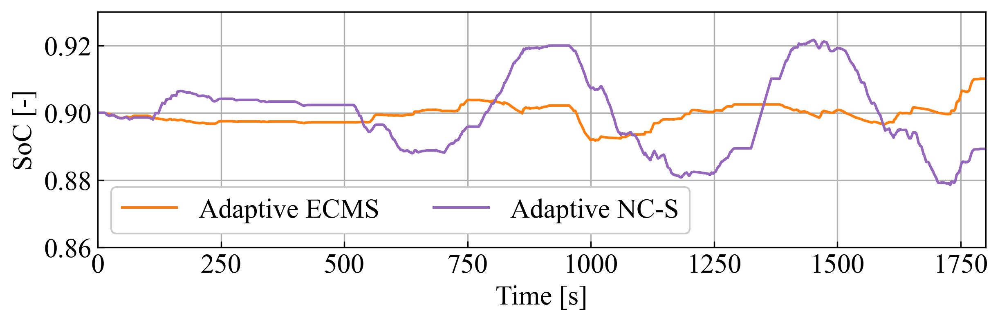

In [79]:
fig, ax1, = plt.subplots(1, 1, sharex=False, sharey=False, facecolor='white', figsize=(8,2.5), dpi=300)
fig.subplots_adjust(left=0.09, right=0.995, top=0.99, bottom=0.22,hspace=0.05,wspace=0.05)

ncol_num = 2
label_name = ['Adaptive ECMS','Adaptive NR-S','Adaptive NR-M','Adaptive NC-S','Adaptive NC-M']
loc_inf = {'horizontalalignment':'left','verticalalignment':'center_baseline',}

cycle_idx = 0
x_lim = len(traj_s_all_CS90_PI[cycle_idx][0])

c = ax1.plot(traj_s_all_CS90_PI[cycle_idx][[0,3],:].T)
c[0].set_color(default_color[1])
c[-1].set_color(default_color[4])
ax1.legend(loc = 3, framealpha=1, labels=[label_name[0],label_name[3]], ncol=ncol_num)
ax1.grid()
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('SoC [-]')
ax1.set_xlim(0,x_lim)
ax1.set_ylim(0.86,0.93)

fig.savefig(r"Fig\TrajectoryStateCS90PI.png")


### CD@0.7-0.5 SoC

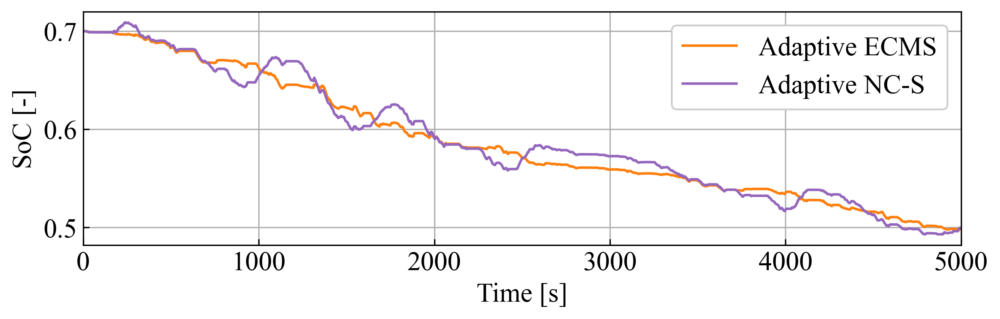

In [80]:
fig, ax1, = plt.subplots(1, 1, sharex=False, sharey=False, facecolor='white', figsize=(8,2.5), dpi=300)
fig.subplots_adjust(left=0.09, right=0.995, top=0.99, bottom=0.22,hspace=0.05,wspace=0.05)

ncol_num = 1
label_name = ['DP','Adaptive ECMS','Adaptive NR-S','Adaptive NR-M','Adaptive NC-S','Adaptive NC-M']
loc_inf = {'horizontalalignment':'left','verticalalignment':'center_baseline',}

cycle_idx = 1
x_lim = len(traj_s_all_CD_PI[cycle_idx][0])

c = ax1.plot(traj_s_all_CD_PI[cycle_idx][[0,3]].T)
c[0].set_color(default_color[1])
c[-1].set_color(default_color[4])
ax1.legend(loc = 0, framealpha=1, labels=[label_name[1],label_name[4]], ncol=ncol_num)
ax1.grid()
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('SoC [-]')
ax1.set_xlim(0,x_lim)
# ax1.set_ylim(0.588,0.613)

fig.savefig(r"Fig\TrajectoryStateCDPI.png")
